# The a priori estimate of the Lieb-Robinson lightcone

The approach presented above is useless from a practical point of view: we first solve the many-body problem, then estimate the lightcone.
To make this approach useful, we need to reverse the steps: we somehow make an a priori estimate of the lightcone, then solve the many-body problem inside this lightcone.

(maxent_lc)=
## Maximum entropy estimate of the Lieb-Robinson lightcone

The first approach to estimate the lightcone is to employ maximum entropy-like considerations. Let us repeat the illustrative Hamiltonian of atom inside a waveguide:

$$
H\left(t\right) = E_{at}  \sigma_{z} + \sigma_{x} \cdot f(t) + h \sigma_{+} a_{0} + h a^{\dagger}_{0} \sigma_{-} + \sum\limits_{i=0}^{\infty} (\varepsilon a^{\dagger}_{i} a_{i} + h a^{\dagger}_{i+1} a_{i} + h a^{\dagger}_{i} a_{i+1})  
$$ (eq_illustr)


We see that the atom speaks to the waveguide by placing a quantum at the site 0. Therefore, in order to estimate the lightcone,  let us see how a single quantum freely propagates from the site 0.

Here we have a one-particle first-quantized problem. The wavefunction $\left| \phi\left(t\right) \right\rangle$  of a single quantum is a superposition of its position on different sites of the chain:

$$
    \left|\phi\left(t\right)\right\rangle = \sum_{k=0}^{\infty} \phi_k\left(t\right) \left| k \right\rangle,
$$

where $\left| k \right\rangle$ represents the quantum which is localized on the $k$th site.

The initial value is 

$$
    \left|\phi\left(0\right)\right\rangle = \left| 0 \right\rangle,
$$

or

$$
    \phi_k\left(0\right) = \delta_{k0}
$$

The free propagation of the quantum is given by a first-quantized tridiagonal Hamiltonian 

$$
   H_1 = \left[\begin{array}{cccc}
\varepsilon & h & 0 & \dots\\
h & \varepsilon & h & \dots\\
0 & h & \varepsilon & \dots\\
\vdots &  & \vdots & \ddots
\end{array}\right]
$$ (H_one_quantum)

Let us solve numerically for $\left| \phi\left(t\right) \right\rangle$:

In [1]:
import numpy as np
import tools

tmax = 800
dt = 0.01
t = np.arange(start = 0, stop = tmax, step = dt)
nt = t.size

ns = 100 # number of chain sites we keep

h = 0.05 # chain hopping
e = 1.0  # chain on-site energy

H1 = tools.tridiag([e]*ns, [h]*(ns-1)) # Hamiltonian for free propagation of a single quantum

phi_ini = np.zeros(ns, dtype = np.cdouble)
phi_ini[0] = 1 # initially quantum is on the site 0

psi_lc = np.zeros((ns, nt), dtype = np.cdouble) # Here we store the propagated orbitals

def H1t(t):
    return H1

for i, psi in tools.evolution(start_index = 0, end_index = nt, H = H1t, dt = dt, initial_state = phi_ini):
    psi_lc[:, i] = np.copy(psi)

We see that the single-quantum problem is easily solved for large times and large chain sizes.

Let us animate the motion of the wavepacket:

In [2]:
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.animation import FuncAnimation

psi_grid = psi_lc[:, ::100]
x = range(ns)
t_ = t[::100]

def update_fi(frame, line, x):
    line.set_ydata( np.abs(psi_grid[:, frame])**2)
    return [line]
    
fig, ax = plt.subplots()
ax.set_xlabel("chain sites")
ax.set_ylabel("|psi(x)|**2");
y = np.abs(psi_grid[:, 0])**2
    
line, = ax.plot(x, y)

nt_ = len(t_)
    
time = np.arange(0, nt_, 1)

animation = FuncAnimation(
    fig,                
    func=update_fi,    
    frames=time,       
    fargs=(line, x),    
    interval=30,       
    blit=True,         
    repeat=True)       

from IPython.display import HTML
display(HTML(animation.to_jshtml()))
plt.close()


We see that the wavepacket of the quantum just flies away from the point of emission. We can intuitively illustrate this process as a ray  originating at the space-time point $(x=0, t=0)$:

```{image} emitted_ray.png
:width: 50%
```
% <img src="emitted_ray.png" alt="Drawing" style="width: 30%;"/>

Here the ray corresponds to the whole wavepacket trajectory $\left\{\left|\phi\left(t\right)\right\rangle: t \geq 0 \right\}$. It is created on site $x=0$ via $\widehat{a}_0^{\dagger}$. Then the wavepacket flies away according to the animation. 

Now suppose that the atom emits quanta into the waveguide during some time interval $\left[0, t \right]$. Then at each time moment new quantum is placed to the site 0, which becomes  a source of a new ray. This leads to  the following picture:

```{image} forward_lightcone.png
:width: 50%
```
% <img src="forward_lightcone.png" alt="Drawing" style="width: 30%;"/>

We see that by the time $t$, there are just newly created quanta in the state $\left|\phi\left(0\right)\right\rangle$. There are also the quanta which where emitted at time $0$, so that by $t$ they are in the state $\left|\phi\left(t\right)\right\rangle$. There are also quanta which were emitted at the intermediate times, so that the whole range of states $\left\{\left|\phi\left(\tau\right)\right\rangle: 0 \leq \tau \leq t \right\}$ appears at $t$.

Then the maximum entropy method is that we do not want to consider what was the actual quantum state of the atom when these quanta were emitted. We also do not want to take into account the correlations between the quanta. We just want to take into acccount the fact that under the free propagation their possible single-particle states are covered by $\left\{\left|\phi\left(\tau\right)\right\rangle: 0 \leq \tau \leq t \right\}$. 

Each $\left|\phi\left(\tau\right)\right\rangle$ corresponds to a pure density matrix $\left|\phi\left(\tau\right)\right\rangle\left\langle \phi\left(\tau\right)\right|$. Then the maximum entropy estimate of the one-body reduced density matrix of all the quanta emitted during $\left[0, t\right]$ is

$$
\widehat{\rho}_{+}\left(t\right) =\mathcal{N}^{-1}\int_0^t d\tau \left|\phi\left(\tau\right)\right\rangle\left\langle \phi\left(\tau\right)\right|,
$$ (realtime_eq)

with some irrelevant normalization constant $\mathcal{N}$.

(lr_metric)=
## Lieb-Robinson metric

Given the explicit expression {eq}`realtime_eq`, we can pose a number of interesting questions. 

Suppose we have some arbitrary one-quantum state $\chi$,

$$
    \left|\chi\right\rangle = \sum_{k=0}^\infty \chi_k \left| k \right\rangle.
$$

We may ask the question, whether $\chi$ is statistically significant for the time evolution during $\left[0, t\right]$. The time evolution is supposed to be generated by a local interaction. The term local means that it can be expressed in terms of some local creation/annihilation operators $a_{loc}^{\dagger}$ and $a_{loc}$,

$$
    a_{loc}^\dagger = \sum_k \phi_{loc}\left(k\right) a_k^{\dagger}.
$$

In our illustrative example {eq}`eq_illustr` we have $a_{loc}\equiv a_0$, and $\phi_{loc}\left(k\right) = \delta_{k0}$.

The average significance is then given  by

$$
    \left\langle \chi \right| \widehat{\rho}_{+}\left(t\right) \left| \chi \right\rangle \equiv \\
    \int_0^t d\tau \left\langle \chi \right| U_1 \left(\tau\right) \left| \phi_{loc} \right\rangle \left\langle \phi_{loc} \right| U_1^{\dagger} \left(\tau\right) \left| \chi \right \rangle,
$$

where in the second line we have generalized to arbitary local interacting site $a_{loc}$. The operator $U_1\left(\tau\right)$ is a one-particle propagator of free quanta of the environment (the chain). In our example it is $U_1\left(\tau\right) = \exp(-i \tau H_1)$ for $H_1$ from {eq}`H_one_quantum`. 

We introduce a treshold $a_{cut}$ in order to decide whether this state can be discarded. This way we introduce the Lieb-Robinson metric

$$
    g\left(\chi, t\right | \phi_{loc}, 0) = \left\langle \chi \right| \widehat{\rho}_{+}\left(t\right) \left| \chi \right\rangle - a_{cut} 
$$ (lr_metric_eq)

For a given $\chi$, and a given source mode $\phi_{loc}$ of the lightcone disturbance, if $g\left(\chi, t\right | \phi_{loc}, 0) < 0$ then the contribution of state $\chi$ is negligible and can be discarded. 

The interior of the Lieb-Robinson lightcone constists of significant states $\chi$, and is defined by the equation

$$
    g\left(\chi, t\right | \phi_{loc}, 0) \geq 0,
$$ (lc_interior)

in analogy with the metric of special relativily.

(rel_treshold)=
### Relative treshold

In the numerical computations it is safer to employ the relative theshold. That is, there is a one-quantum state $\left|\phi_m\right\rangle$ which is the most significant on $\left[0, t\right]$:

$$
    \phi_m = \arg\max_{\phi} = \left\langle \phi \right| \widehat{\rho}_{+}\left(t\right) \left| \phi \right\rangle.
$$

It's average significance is given by the maximal eigenvalue $\pi_m\left(t\right)$ of $\widehat{\rho}_{+}\left(t\right)$ due to the Rayleigh-Ritz variational principle. 

Then we choose a relative significance treshold $r_{cut}$, e.g. $r_{cut}=10^{-4}$ and introduce the time-dependnet cut-off $a_{cut}$ as

$$
    a_{cut} = r_{cut} \pi_m\left(t\right).
$$

Then the interior of the lightcone {eq}`lc_interior` consists only of the states whose statistical contribution is non-negligible relatively to the maximally significant one.


(test_apriori_lc)=
## Test of the a priori lightcone estimate on example problem. 

Let us apply our lightcone estimate to the problem {eq}`lightcone_restricted_ham`.

We just propagate $g\left(\chi, t\right | \phi_{loc},0)$ forward in time and compute it for $\chi$ chosen as the chain sites. We add the latter to the Hamiltonian when the metric becomes positive:

In [3]:
r_cut = 10**(-4)

ti = [0]
rho_plus = np.zeros((ns, ns), dtype = np.cdouble)
j = 1
for i in range(nt-1):
    # update rho_plus
    psi = tools.as_column_vector(psi_lc[:, i])
    rho_plus += tools.dyad(psi, psi) * dt
    # find max eigenvalue
    pi_max, _ = tools.find_largest_eigs(rho_plus, 1)
    # check whether we are inside the lightcone
    site_sig = rho_plus[j + 1, j + 1]
    lr_metric = site_sig - r_cut * pi_max
    if lr_metric > 0:
        ti.append(i)
        j += 1
        if j==ns-1:
            # if all sites are coupled
            break

if ti[-1] < nt-1:
    ti.append(nt-1)
        


Let us visualize the resulting $m\left(t\right)$:

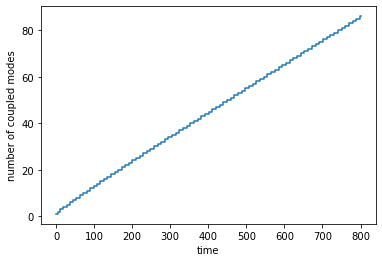

In [4]:
       
x = []
y = []

for i in range(len(ti)-1):
    x.append(t[ti[i]])
    x.append(t[ti[i+1]])
    y.append(i+1)
    y.append(i+1)

plt.xlabel('time')
plt.ylabel('number of coupled modes')

plt.plot(x, y)


Once more on a smaller scale to see the step-wise growth:

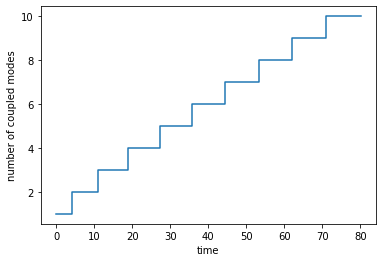

In [5]:
plt.xlabel('time')
plt.ylabel('number of coupled modes')

plt.plot(x[:20], y[:20])

Let us solve the quench problem to test the a priori estimate.
First, with all the sites coupled:

In [8]:
import secondquant as sq
hs_atom = sq.fock_space(num_modes = 1, max_total_occupation = 1, statistics = 'Bose')
m = 10 
n = 7 
fs_chain = sq.fock_space(num_modes = m, max_total_occupation = n, statistics = 'Bose') 
hs_joint = sq.fock_space_kron(hs_atom, fs_chain)
b_hat = hs_joint.annihilate
b_hat_dag = hs_joint.create
sigma_m = b_hat[0]
sigma_p = b_hat_dag[0]
sigma_x = hs_joint.sigmax(0)
a_hat = b_hat[1:]
a_hat_dag = b_hat_dag[1:]

Eat = 1.0
h = 0.05
e = 1.0

def f(t):
    return(0.1*np.cos(t))

Hconst = Eat * sigma_p @ sigma_m + h * sigma_p @ a_hat[0] + h * sigma_m @ a_hat_dag[0] \
    + e * sum([a_hat_dag[i] @ a_hat[i] for i in range(m)]) \
    + h * sum([a_hat_dag[i + 1] @ a_hat[i] + a_hat_dag[i] @ a_hat[i + 1] for i in range(m-1)])

def H(t):
    return Hconst + f(t) * sigma_x

def Hi(ti):
    return H(ti * dt + dt/2)

K = hs_joint.dimension
psi_ini = np.zeros(K, dtype = complex)
psi_ini[0] = 1 

tmax = 80
dt = 0.01
t = np.arange(start = 0, stop = tmax, step = dt)
nt = t.size

nq = np.zeros(nt)

for i, psi in tools.evolution(start_index = 0, end_index = nt, H = Hi, dt = dt, initial_state = psi_ini):
    nq[i] = (np.conj(psi) @ sigma_p @ sigma_m @ psi).real

(solve_inside_lc)=
### Then 
let us solve the Schrodinger equation but now keeping only $m\left(t\right)$ modes (from the a priori estimate):

Text(0, 0.5, 'occupation of qubit')

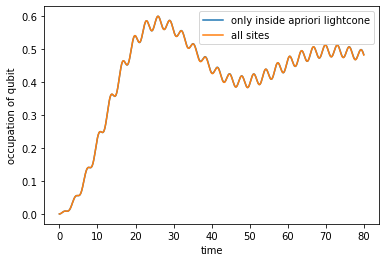

In [9]:
nq2 = np.zeros(nt)

def eval():
    
    psi_begin = np.copy(psi_ini)
    
    for j in range(len(ti)-1):
        a = ti[j]
        b = ti[j+1]
    
        if a>nt-1:
            return
        b = min(b, nt-1)
    
        Hmconst = Eat * sigma_p @ sigma_m + h * sigma_p @ a_hat[0] + h * sigma_m @ a_hat_dag[0] \
            + e * sum([a_hat_dag[i] @ a_hat[i] for i in range(j + 1)]) \
            + h * sum([a_hat_dag[i + 1] @ a_hat[i] + a_hat_dag[i] @ a_hat[i + 1] for i in range(j)])
    
        def Hm(t):
            return Hmconst + f(t) * sigma_x
    
        def Hmi(ti):
            return H(ti * dt + dt/2)
    
        #nonlocal psi_begin
        for i, psi in tools.evolution(start_index = a, end_index = b, H = Hmi, dt = dt, initial_state = psi_begin):
            nq2[i] = (np.conj(psi) @ sigma_p @ sigma_m @ psi).real
            
            
        
        psi_begin = psi
        
eval()
              
plt.plot(t[:-2], nq2[:-2], label = 'only inside apriori lightcone')
plt.plot(t, nq, label = 'all sites')
plt.legend()
plt.xlabel('time')
plt.ylabel('occupation of qubit')

We see that the a priori lightcone works!

(lc_deriv_through_intensity)=
## Estimate the lightcone through the average intensity of coupling 

Here we provide another derivation of the Lieb-Robinson metric {eq}`lr_metric_eq`. This will greately extend the range of situations when our ideas can be applied.

Suppose we have a single-particle state $\chi$, whose significance we want to estimate,

$$
    \left|\chi\right\rangle = \sum_{k=0}^\infty \chi_k \left| k \right\rangle.
$$

We can associate the annihilation and creation opetors to it as

$$
    \widehat{\chi}^{\dagger} = \sum_{k=0}^\infty \chi_k a^{\dagger}_k
$$

Therefore the $\chi$ generates its own Fock space, and we will call such one-particle states the degrees of freedom, or the modes.

### Switch to the interaction picture

Let us switch to the interaction picture with respect to the bath (the chain): the Hamiltonian {eq}`quench_hamiltonian` becomes

$$
H\left(t\right) = E_{at}  \sigma_{z} + \sigma_{x} \cdot f(t) + h \sigma_{+} a_{0}\left(t\right) + h a^{\dagger}_{0}\left(t\right) \sigma_{-},
$$

where

$$
    a_0\left(t\right) = \exp\left(i t H_{bath}\right) a_0 \exp\left(-i t H_{bath}\right),
$$

and

$$
    H_{bath} = \sum\limits_{i=0}^{\infty} (\varepsilon a^{\dagger}_{i} a_{i} + h a^{\dagger}_{i+1} a_{i} + h a^{\dagger}_{i} a_{i+1}).  
$$

The trial degree of freedom $\chi$ becomes

$$
    \widehat{\chi}^{\dagger}\left(t\right) = \sum_{k=0}^\infty \chi_k\left(-t\right) a^{\dagger}_k,
$$

where $\chi_k\left(-t\right) = \left\langle k \right| \exp(i t H_1) \left| \chi \right\rangle$ with $H_1$ defined by {eq}`H_one_quantum`.
Below we denote $\chi_{int} \equiv \chi\left(-t\right)$.

There is analogous relation for $a_0^{\dagger}\left(t\right)$:

$$
   a_0^{\dagger}\left(t\right) = \sum_{k=0}^\infty \phi_k\left(-t\right) a^{\dagger}_k,
$$ (a_0_int)

with $\phi_k \left(-t\right) = \left\langle k \right| \exp(i t H_1) \left| 0 \right\rangle$.

### Bipartition of the many-body state

The joint state of open system and the chain $\left|\Psi\left(\tau\right)\right\rangle$ can be bipartitioned as

$$
    \left|\Psi\left(\tau\right)\right\rangle = \sum_k \left|\Psi_k\left(\tau\right)\right\rangle_{rest} \otimes \widehat{\chi}^{\dagger k}\left(t\right) \left|0\right\rangle_{\chi},
$$

where $\left|0\right\rangle_{\chi}$ denotes the vacuum of the mode $\chi_{int}$, and $\left|\cdot\right\rangle_{rest}$ denote the state of the rest (atom + other chain modes). Here $\tau\leq t$. Observe the placement of $t$ and $\tau$ arguments: we want to estimate the average significance of $\chi_{int}$ at time $t$ for evolution during all earlier time moments $\tau$.

At all earlier times $\tau$ the coupling is through $a_0\left(\tau\right)$ and $a^{\dagger}_0\left(\tau\right)$. We can decompose these operators as:

$$
    a_0\left(\tau\right) = a_{rest}\left(\tau\right) + \mathcal{A}\left(\tau - t \right) \widehat{\chi}\left(t\right),
$$ (bipartite_decomposition)

so that each term acts on the corresponding part of the bipartition. One obtains:

$$
    \mathcal{A}\left(\tau - t\right) = \left[ a_0\left(\tau\right), \widehat{\chi}^{\dagger}\left(t\right)\right]_\xi
$$

with $\xi=-1$ for bosons, and $\xi=+1$ for fermions. Therefore, the contribution of $\chi_{int}$ to the coupling is always weighted with $\mathcal{A}\left(\tau - t\right)$. If the  intensity

$$
    \left| \mathcal{A}\left(\tau-t\right) \right|^2
$$

is negligible, then the interaction with $\chi_{int}$ at time $\tau$ does not contrubute to the evolution, irrespectively what is the many-body state $\left|\Psi\left(\tau\right)\right\rangle$.

Then the average significance of $\chi$ during the time interval $\left[0,t\right]$ is

$$
    I\left(t\right) = \int_0^t d\tau \left| \mathcal{A}\left(\tau - t\right) \right|^2,
$$

which can be interpreted as a mean intensity of coupling to $\chi_{int}$ during the time interval $\left[0, t\right]$

Using the relation {eq}`a_0_int`,
one can compute the commutator $\mathcal{A}\left(\tau - t\right)$ to obtain:

$$
    I\left(t\right) = \int_0^t d\tau \left\langle \chi\left(-t\right)\right| \phi\left(-\tau\right) \left\rangle \right\langle \phi\left(-\tau\right) \left|\chi\left(-t\right)\right\rangle \\= \int_0^t d\tau \left\langle \chi\right| \phi\left(t-\tau\right) \left\rangle \right\langle \phi\left(t-\tau\right) \left|\chi\right\rangle \\=  \left\langle \chi\right| \widehat{\rho}_{+}\left(t\right) \left|\chi\right\rangle.
$$ (intensity_computed)

Which coincides with the maximum entropy estimate {eq}`realtime_eq`.

In the case of general local interaction site $a_{loc}$, the decomposition {eq}`bipartite_decomposition` still holds with the replacement $a_0\to a_{loc}$ everywhere, and with initial condition $\phi\left(\tau=0\right)=\phi_{loc}$.

```{important}
We have demonstrated, that even if the initial state of the environment (the chain) is a highly-correlated one, still the a priory lightcone estimate is valid. The lightcone interior consists of modes which have significant average intensity of interaction, irrespectively of what is the actual many-body state. However we need to carefully take into account the free motion of modes outside the lightcone. This is the content of the next section
```